In [7]:
import pathlib
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
colormap = plt.cm.PuBu
sns.set(font_scale=2)


['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

In [55]:
BASEPATH = '/workspace/data/unzipfiles'

COLUMNS = ['time','STN','Lon','Lat','isitu-LST','Band1','Band2','Band3','Band4',
                'Band5','Band6','Band7','Band8','Band9','Band10','Band11','Band12','Band13',
                'Band14','Band15','Band16','30daysBand3','30daysBand13','GK2A-LST','SolarZA',
                'SateZA','ESR','Height','LandType','instiu-TA','instiu-HM','instiu-TD','instiu-TG',
                'instiu-TED0.05','instiu-TED0.1','instiu-TED0.2','instiu-TED0.3','instiu-TED0.5',
                'instiu-TED1.0','instiu-TED1.5','instiu-TED3.0','instiu-TED5.0','instiu-PA','instiu-PS']
MONTHS = [f'{i:0>2}' for i in range(1, 13)]
TARGETS = ['GK2A-LST', 'instiu-TA']

PATH = pathlib.Path(BASEPATH)
PATHS = {month: list(PATH.glob(f'202*{month}/*.csv')) for month in MONTHS}

In [56]:
PATHS

{'01': [PosixPath('/workspace/data/unzipfiles/202001/20200112.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200105.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200109.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200110.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200103.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200122.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200123.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200119.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200108.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200125.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200101.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200104.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200120.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200113.LST.csv'),
  PosixPath('/workspace/data/unzipfiles/202001/20200116.

In [68]:
def getFiles(path):
    file = pd.read_csv(path, names=COLUMNS)
    return file

def getCorr(file):
    corr = file.corr()
    t1 = corr[TARGETS[0]]
    t2 = corr[TARGETS[1]]
    return t1, t2
    
def appendDF(df1, df2):
    return pd.concat([df1, df2], axis=1)

    
lst_corr = {month: pd.DataFrame() for month in MONTHS}
ta_corr = {month: pd.DataFrame() for month in MONTHS}

for month, paths in PATHS.items():
    for path in paths:
        print(path)
        name = path.name.split('.')[0]
        file = getFiles(path)

        lst_corr_, ta_corr_ = getCorr(file)
        lst_corr_.name = name
        ta_corr_.name = name
        
        lst_corr[month] = appendDF(lst_corr[month], lst_corr_)
        ta_corr[month] = appendDF(ta_corr[month], ta_corr_)

/workspace/data/unzipfiles/202001/20200112.LST.csv
/workspace/data/unzipfiles/202001/20200105.LST.csv
/workspace/data/unzipfiles/202001/20200109.LST.csv
/workspace/data/unzipfiles/202001/20200110.LST.csv
/workspace/data/unzipfiles/202001/20200103.LST.csv
/workspace/data/unzipfiles/202001/20200122.LST.csv
/workspace/data/unzipfiles/202001/20200123.LST.csv
/workspace/data/unzipfiles/202001/20200119.LST.csv
/workspace/data/unzipfiles/202001/20200108.LST.csv
/workspace/data/unzipfiles/202001/20200125.LST.csv
/workspace/data/unzipfiles/202001/20200101.LST.csv
/workspace/data/unzipfiles/202001/20200104.LST.csv
/workspace/data/unzipfiles/202001/20200120.LST.csv
/workspace/data/unzipfiles/202001/20200113.LST.csv
/workspace/data/unzipfiles/202001/20200116.LST.csv
/workspace/data/unzipfiles/202001/20200114.LST.csv
/workspace/data/unzipfiles/202001/20200126.LST.csv
/workspace/data/unzipfiles/202001/20200111.LST.csv
/workspace/data/unzipfiles/202001/20200131.LST.csv
/workspace/data/unzipfiles/2020

In [60]:
lst_corr['01']

,20200112,20200105,20200109,20200110,20200103,20200122,20200123,20200119,20200108,20200125,...,20210129,20210114,20210102,20210106,20210109,20210126,20210119,20210111,20210105,20210115
time,0.315054,-0.436542,0.240838,-0.086733,0.572433,0.040856,-0.003907,0.461814,0.101579,-0.093552,...,0.122087,-0.018798,0.245097,-0.342718,0.012894,0.420241,0.042111,0.077447,0.271057,-0.429575
STN,-0.134334,-0.089595,-0.201097,-0.151107,-0.070835,-0.068294,-0.163058,-0.081419,0.003983,-0.079556,...,-0.132327,-0.100382,-0.158559,-0.106096,-0.116629,-0.034521,-0.087826,-0.122022,-0.165199,0.029196
Lon,0.104981,-0.035535,0.043751,-0.036749,-0.058225,-0.060524,-0.155217,0.001152,0.228552,-0.062302,...,0.213471,0.093633,0.191658,0.272283,0.301354,0.041128,0.046911,0.041364,0.103811,0.112099
Lat,0.277533,0.055196,0.431053,0.188548,0.068530,0.151153,0.328625,0.088864,-0.005594,0.185720,...,0.376121,0.095498,0.446180,0.366302,0.397094,0.072241,0.120409,0.321503,0.465522,-0.109100
isitu-LST,-0.000589,0.031593,-0.008760,0.039162,0.007882,-0.015511,-0.040924,0.016651,0.037117,-0.020534,...,0.013578,0.039678,-0.061123,-0.047684,-0.069794,-0.001393,0.022223,-0.096605,-0.069712,0.033768
Band1,0.057898,0.070371,0.067352,0.084939,0.762957,0.014844,0.046296,0.046638,0.027311,0.017533,...,0.152581,0.176101,0.123404,0.100113,0.120746,0.029372,0.170435,0.049769,0.079935,0.045224
Band2,0.057885,0.070364,0.067346,0.084925,0.762957,0.014828,0.046263,0.046640,0.027311,0.017525,...,0.152580,0.176106,0.123396,0.100097,0.120747,0.029376,0.170438,0.049783,0.079920,0.045222
Band3,0.057865,0.070361,0.067342,0.084910,0.762957,0.014807,0.046222,0.046648,0.027317,0.017516,...,0.152589,0.176124,0.123391,0.100081,0.120761,0.029386,0.170456,0.049814,0.079905,0.045223
Band4,0.057870,0.070393,0.067336,0.084949,0.762957,0.014813,0.046282,0.046605,0.027281,0.017514,...,0.152619,0.176155,0.123425,0.100141,0.120737,0.029345,0.170480,0.049747,0.079943,0.045189
Band5,0.058009,0.070356,0.067431,0.084863,0.762957,0.014886,0.046250,0.046967,0.027629,0.017550,...,0.152657,0.176146,0.123470,0.100095,0.121045,0.029774,0.170490,0.050175,0.079975,0.045497


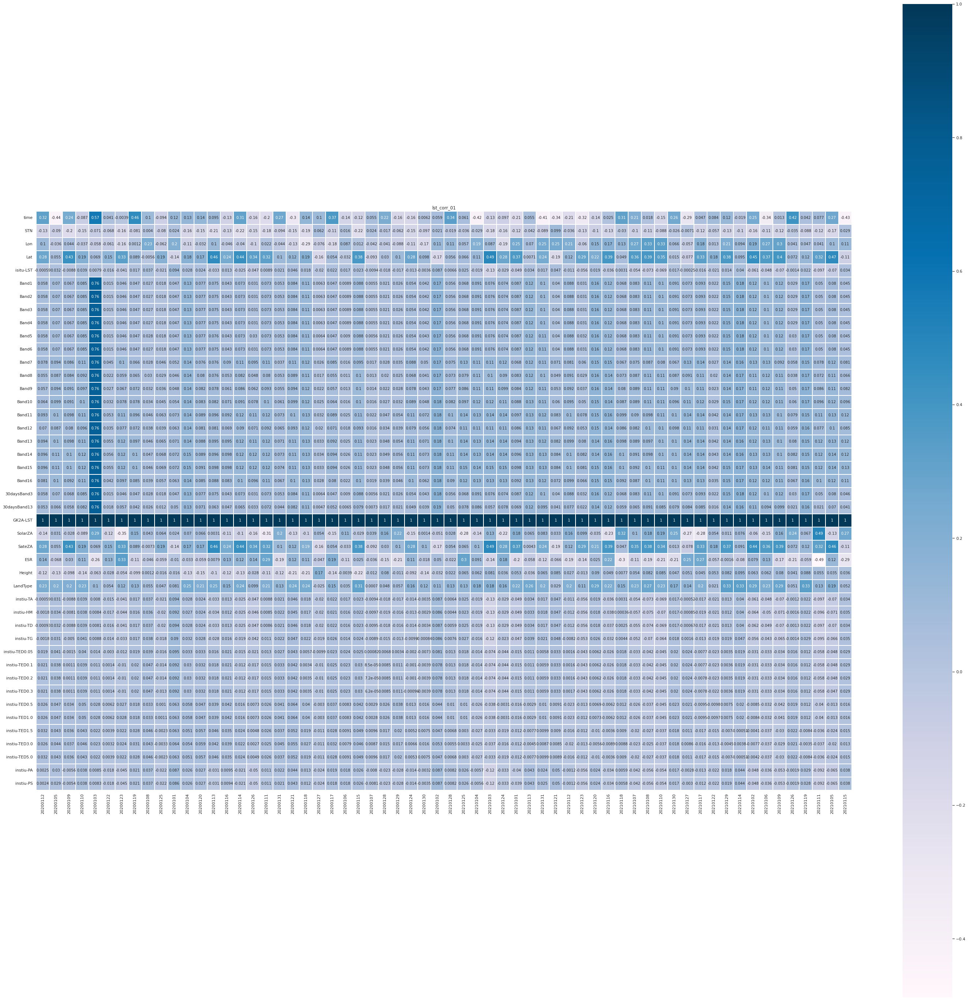

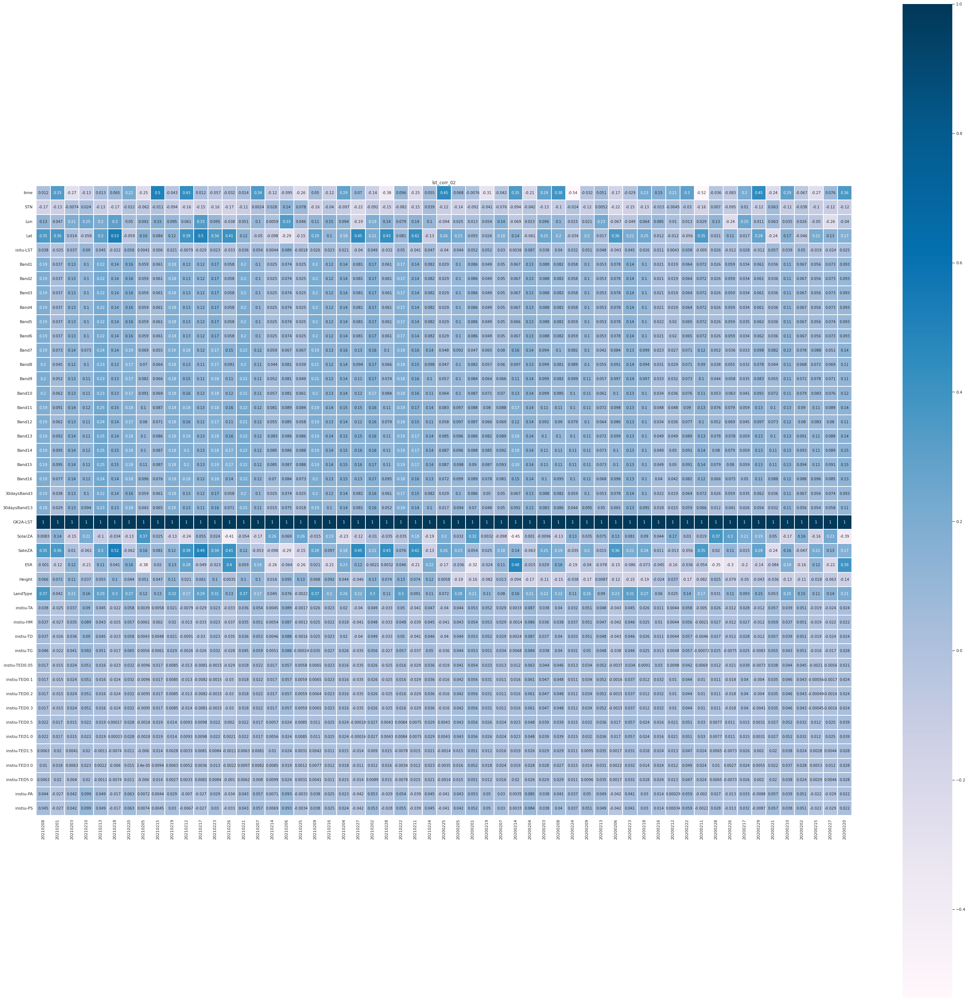

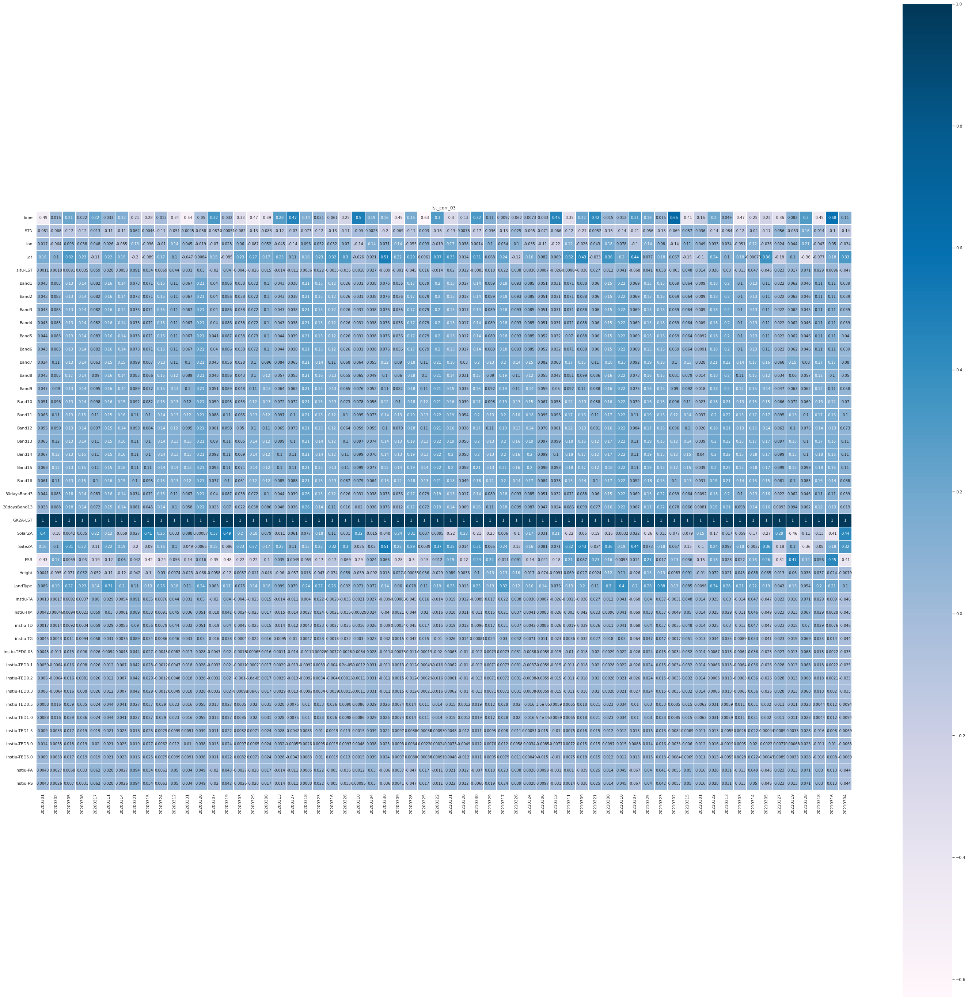

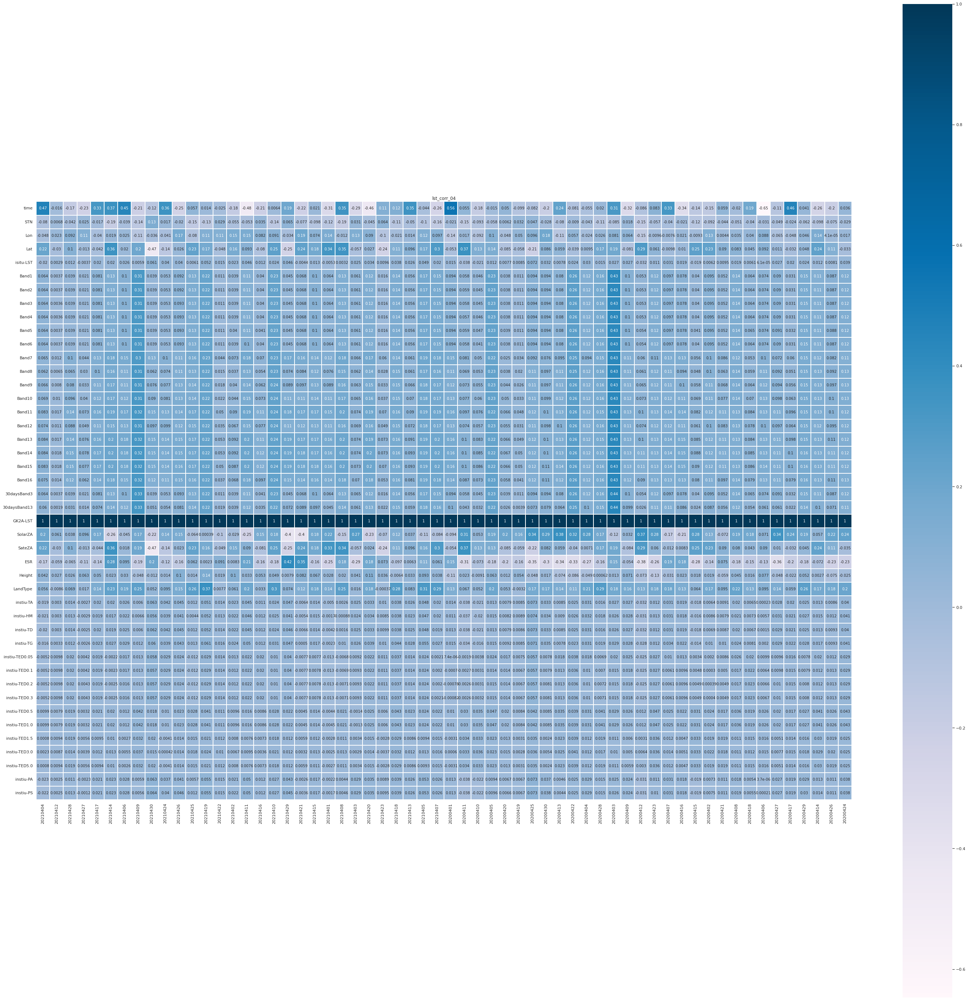

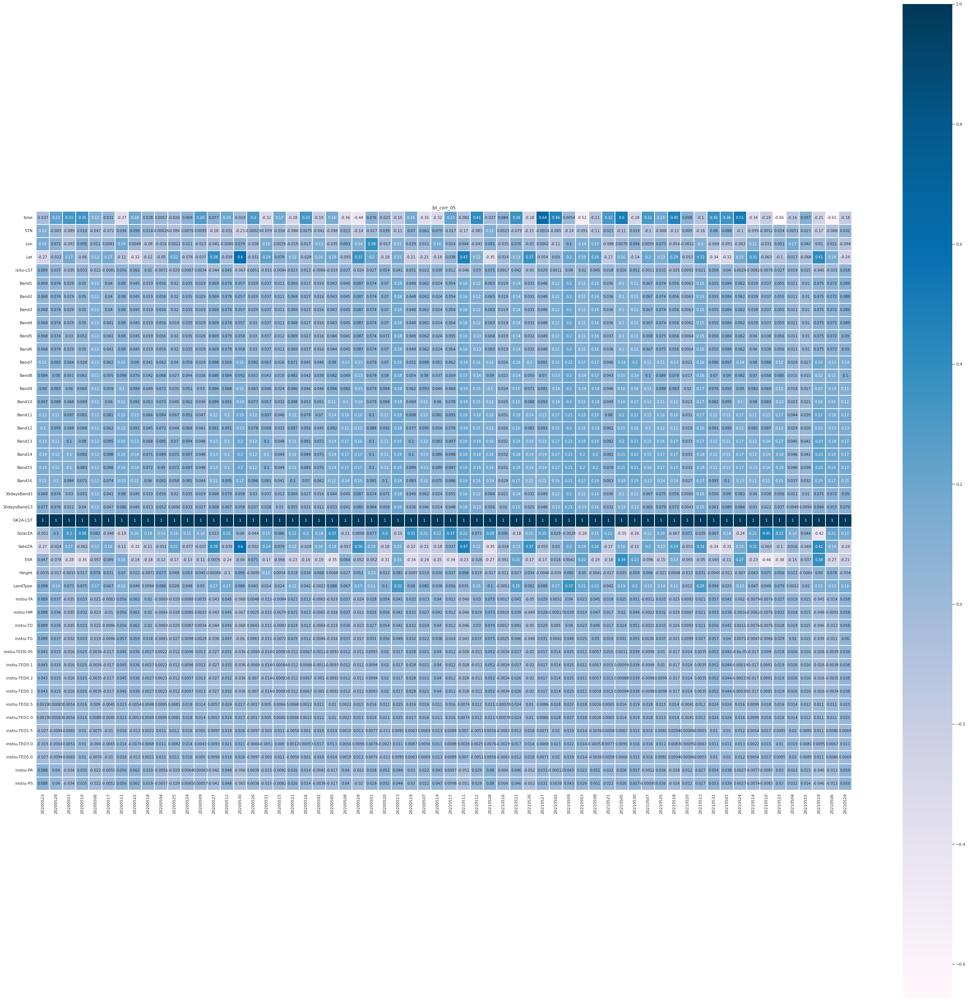

...

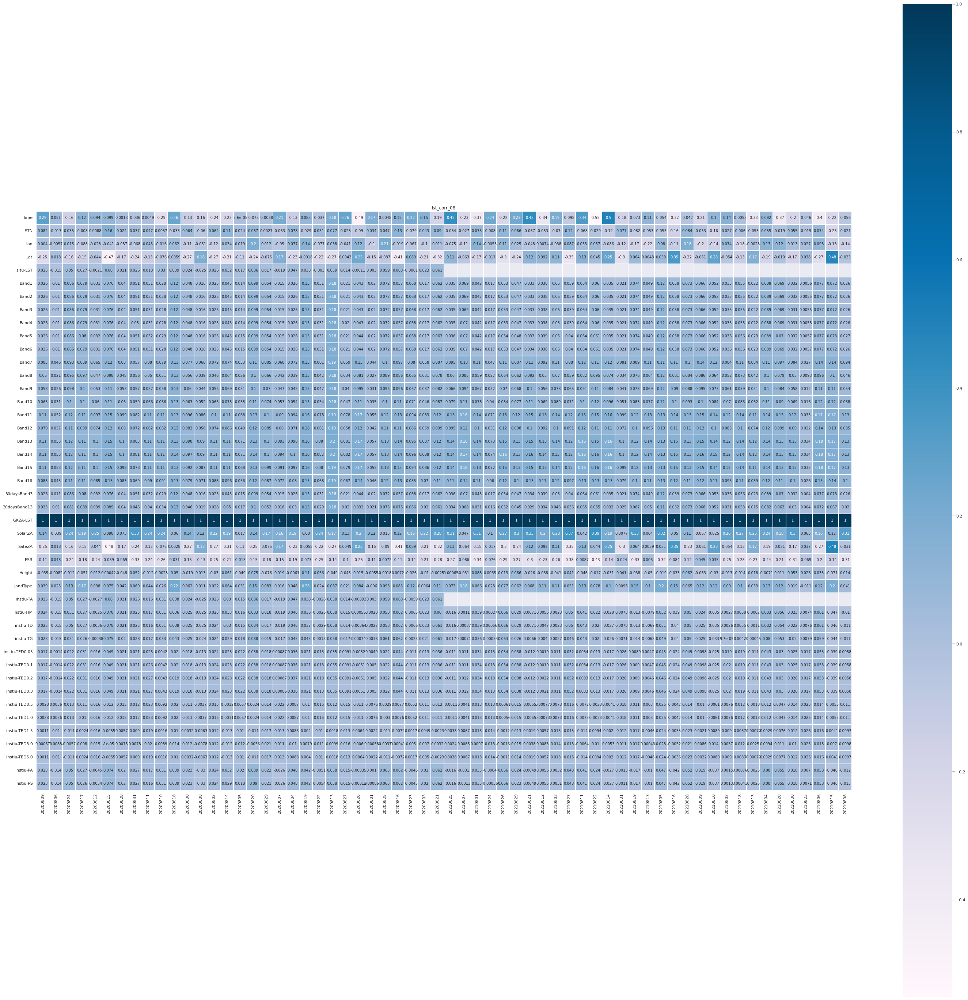

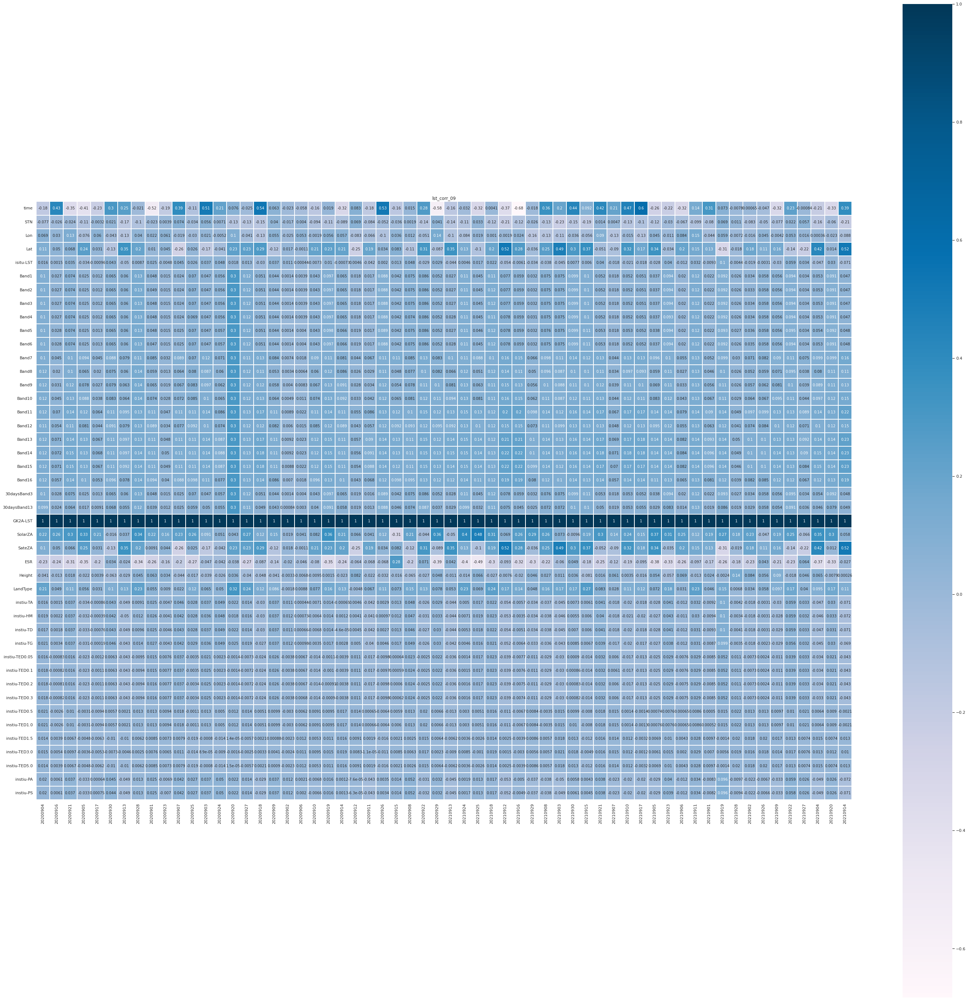

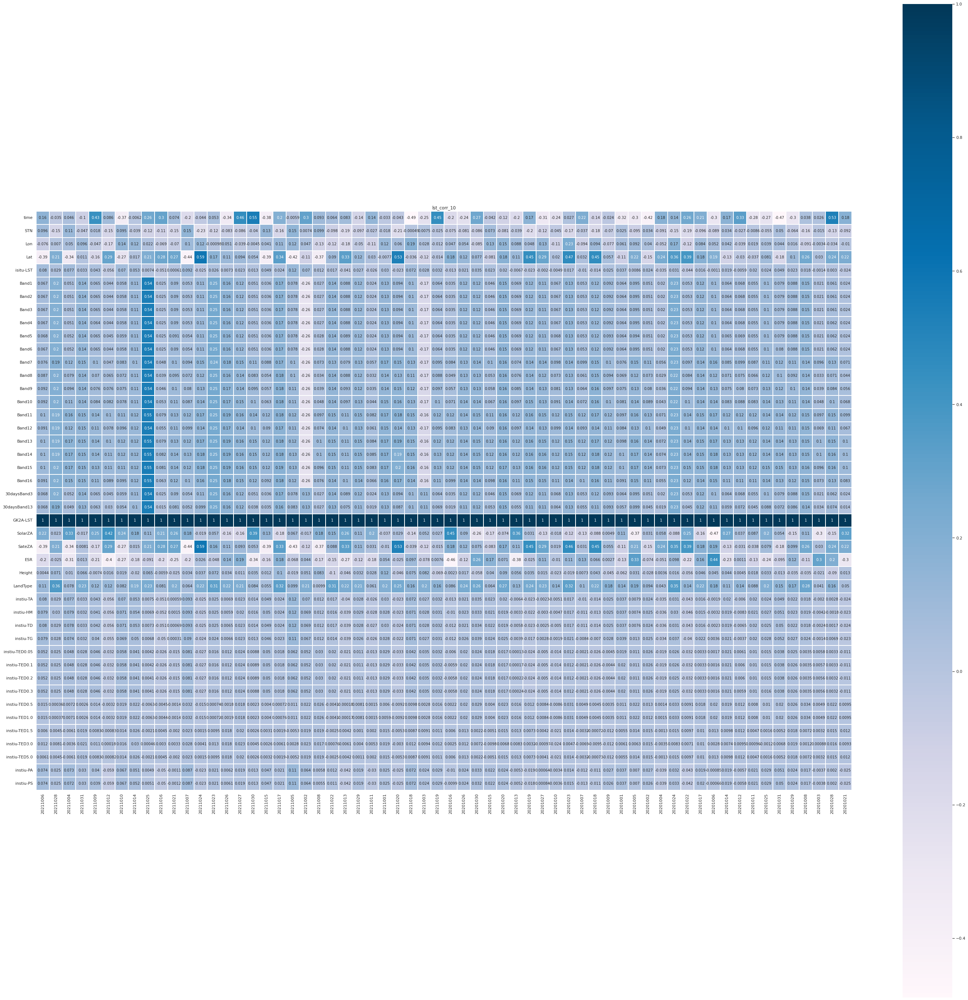

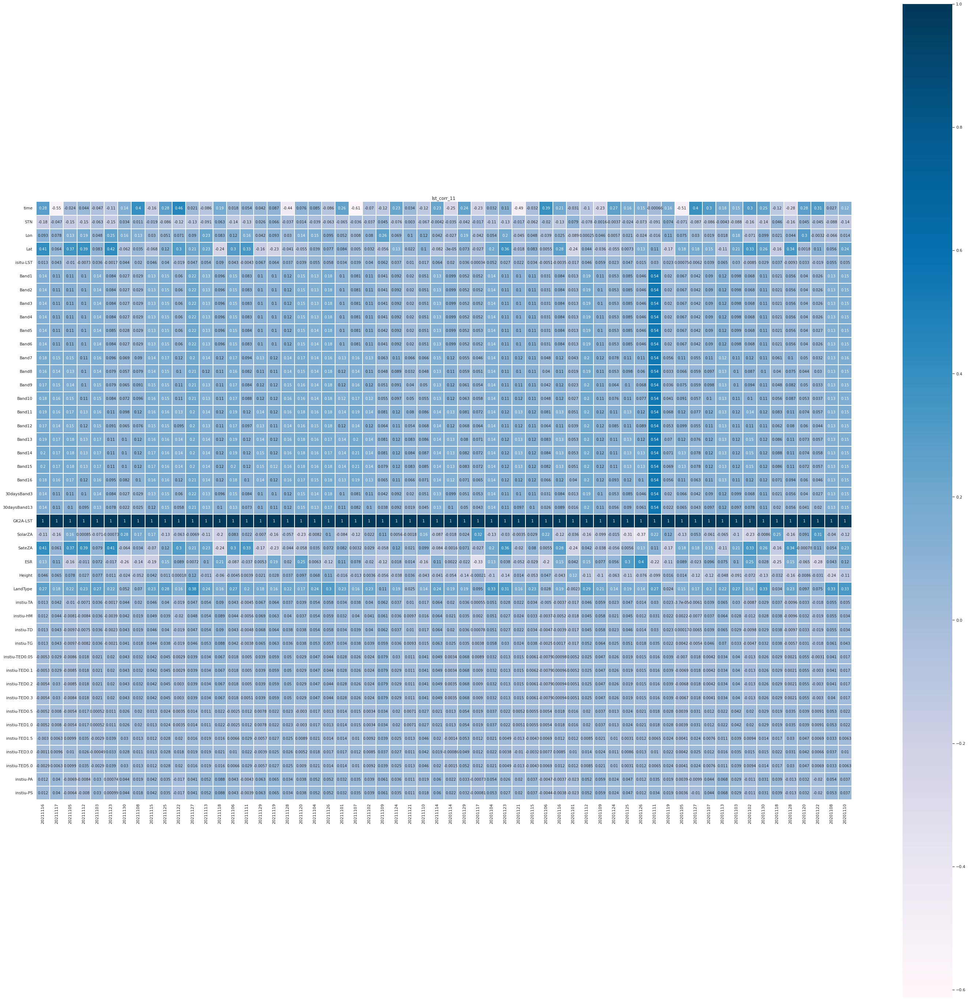

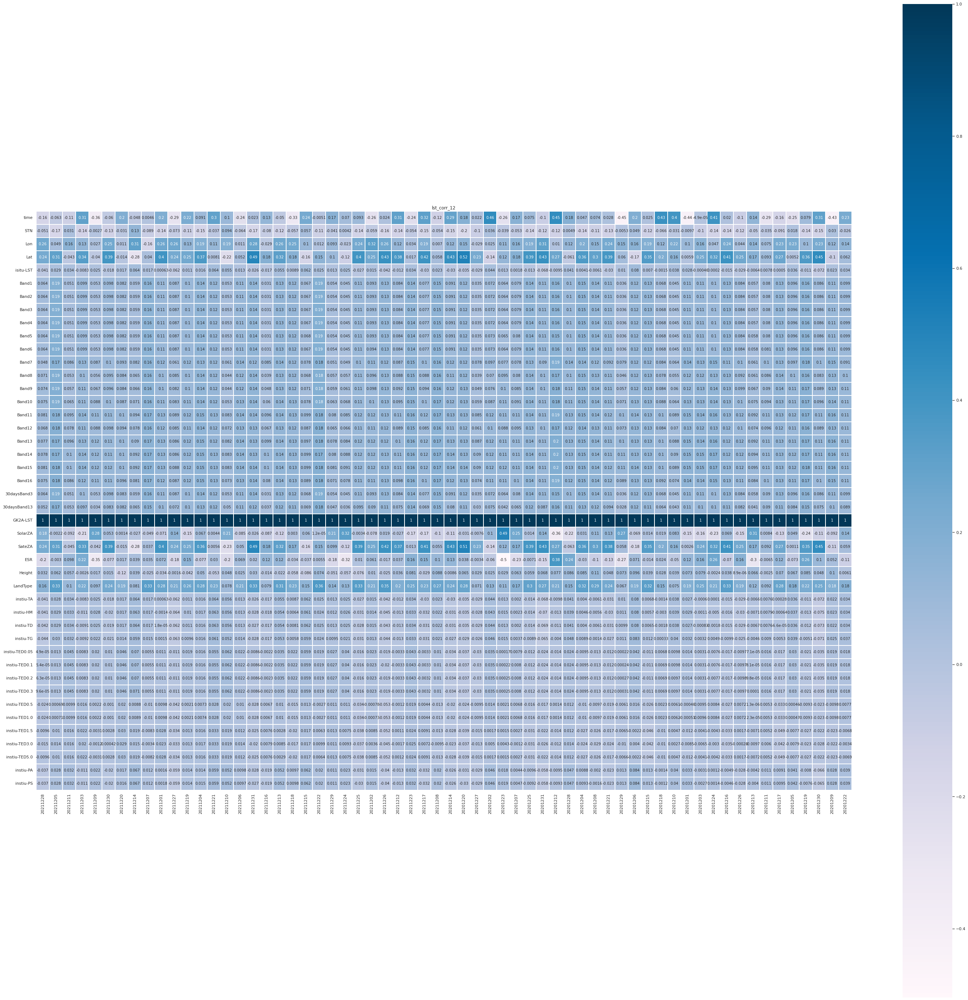

In [65]:

for month in MONTHS:
    plt.figure(figsize=(50, 50))
    plt.title(f'lst_corr_{month}')
    sns.set(font_scale=1)
    sns.heatmap(lst_corr[month], 
                linewidths = 0.1, 
                vmax = 1.0,
               square = True, 
                cmap = colormap, 
                linecolor = "white", 
                annot = True, 
                annot_kws = {"size" : 10}
               )


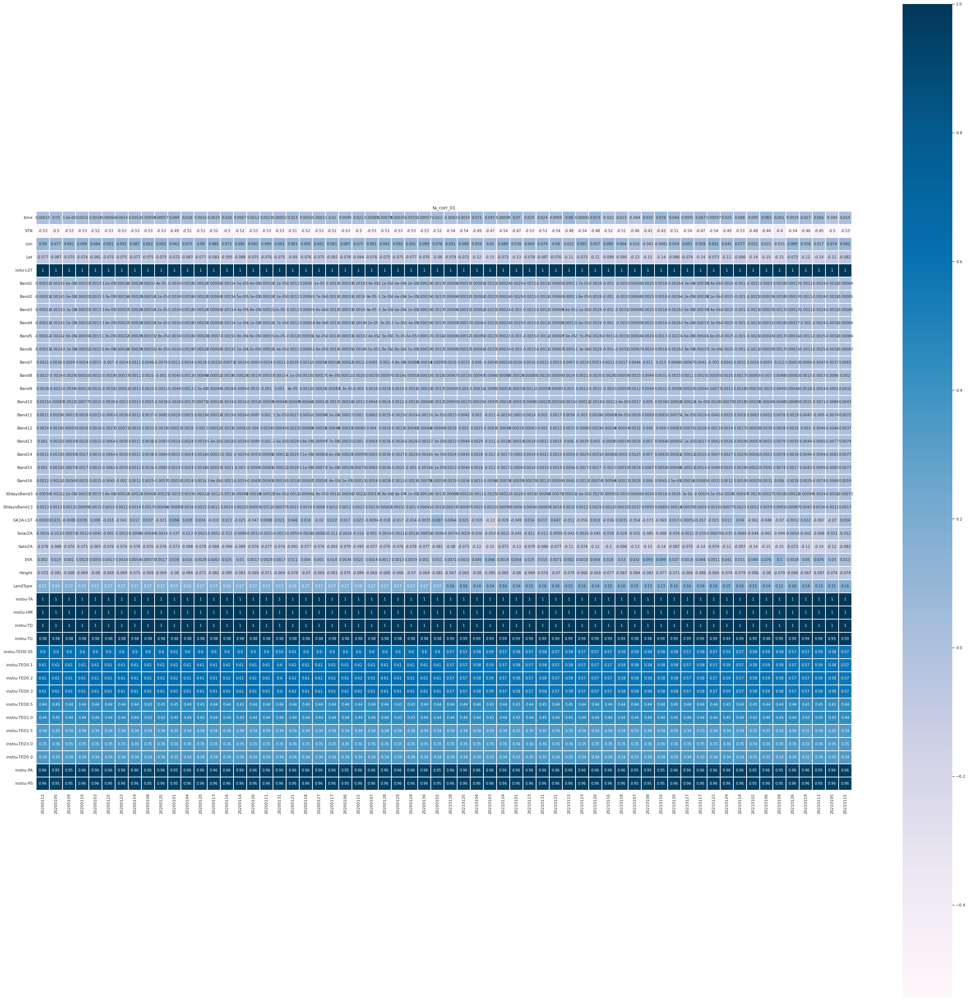

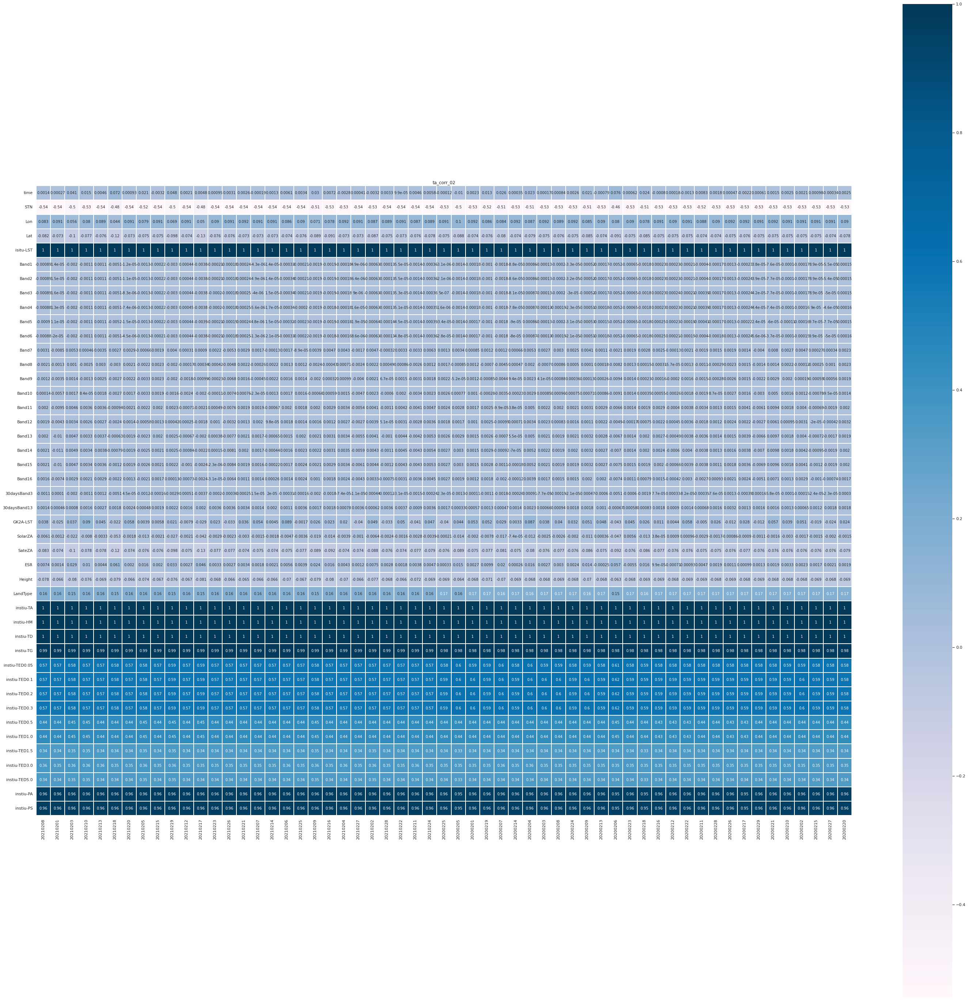

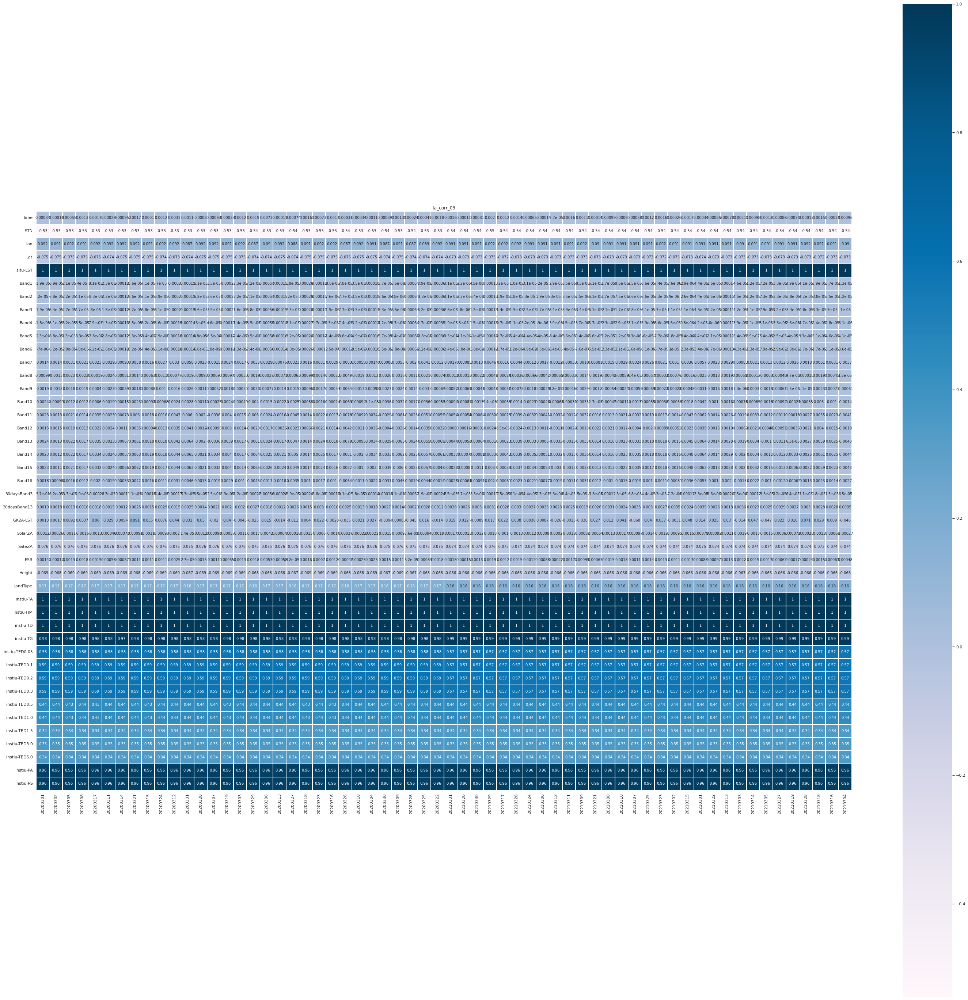

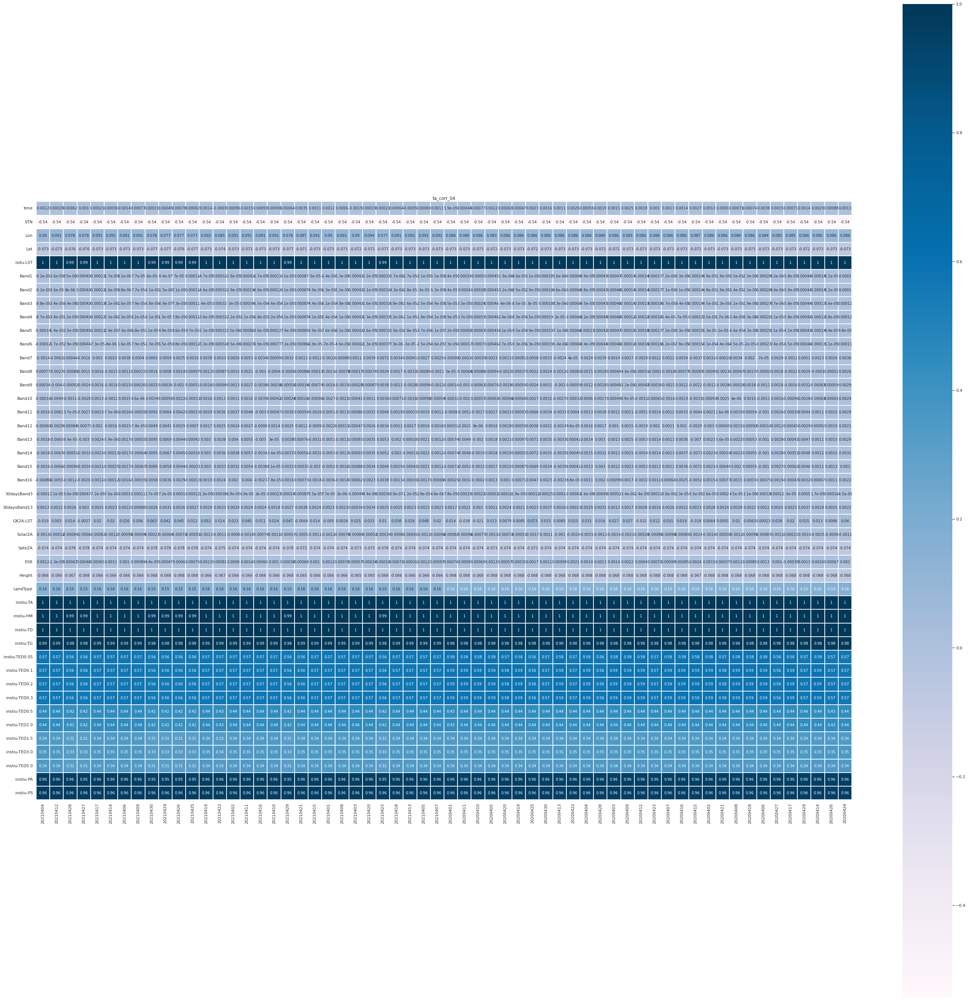

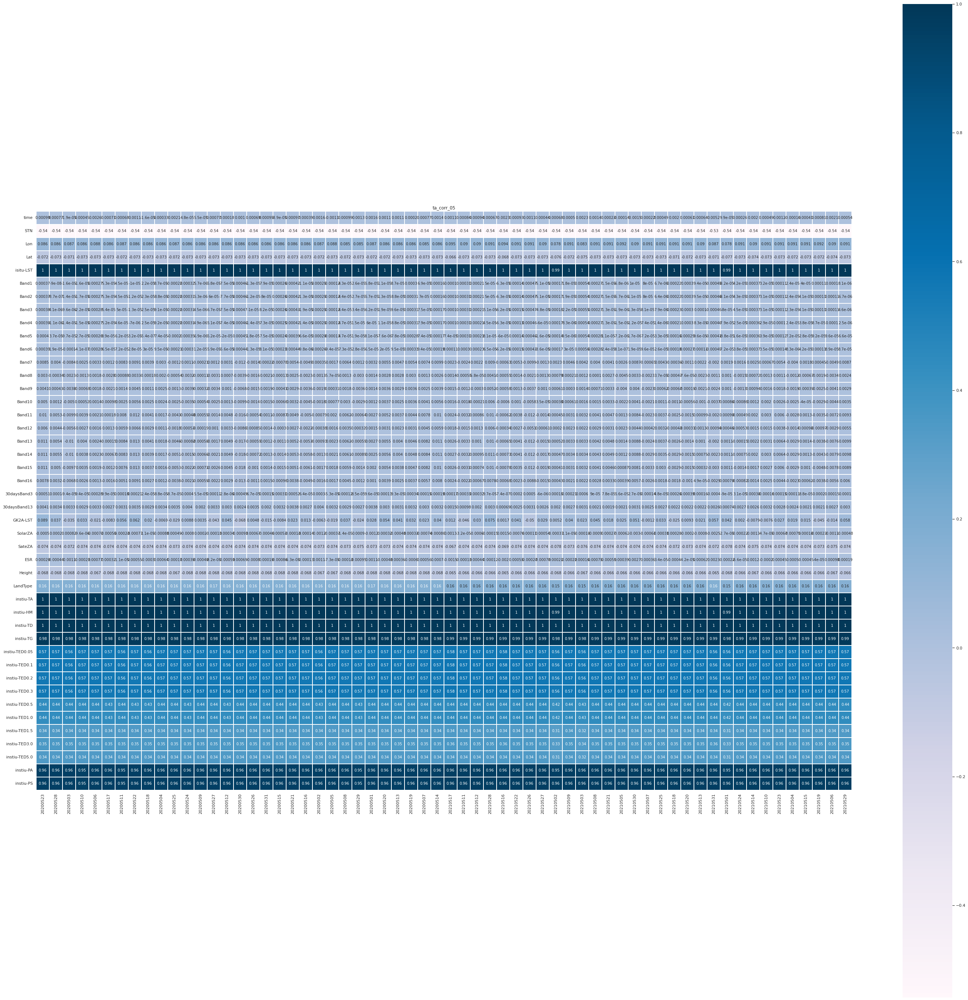

...

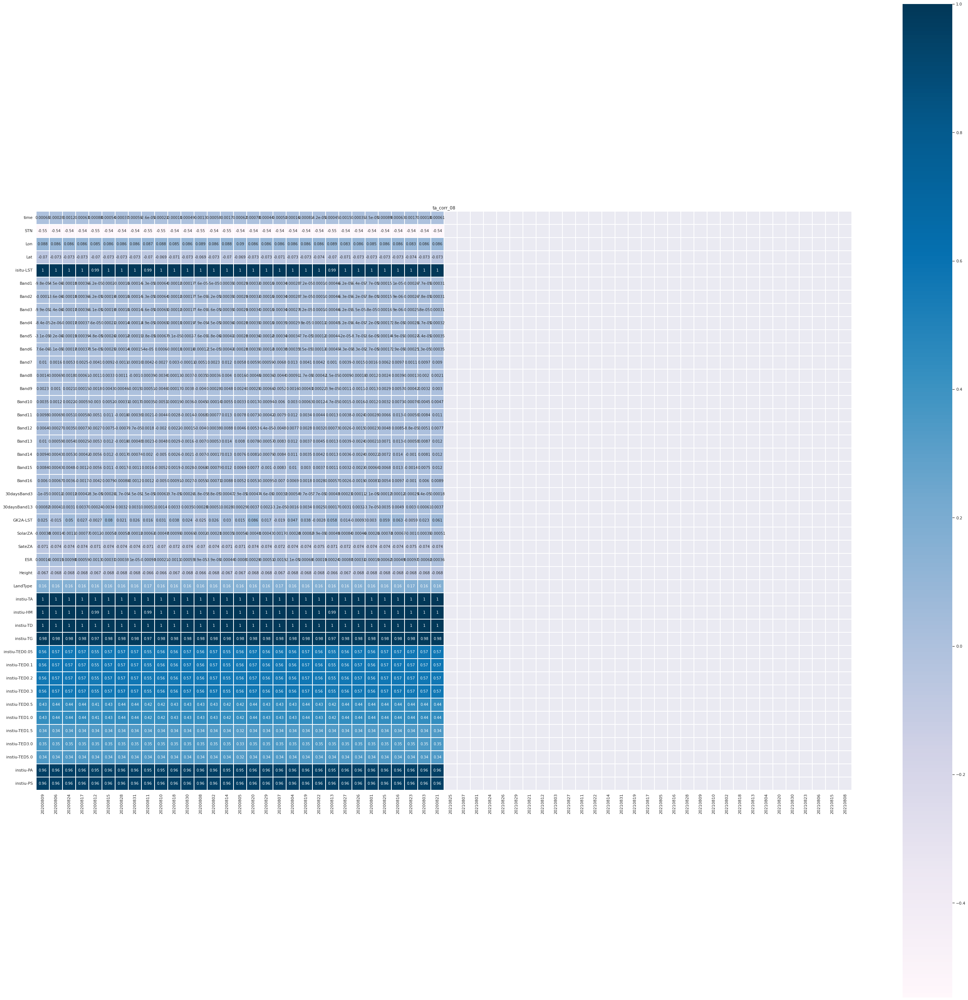

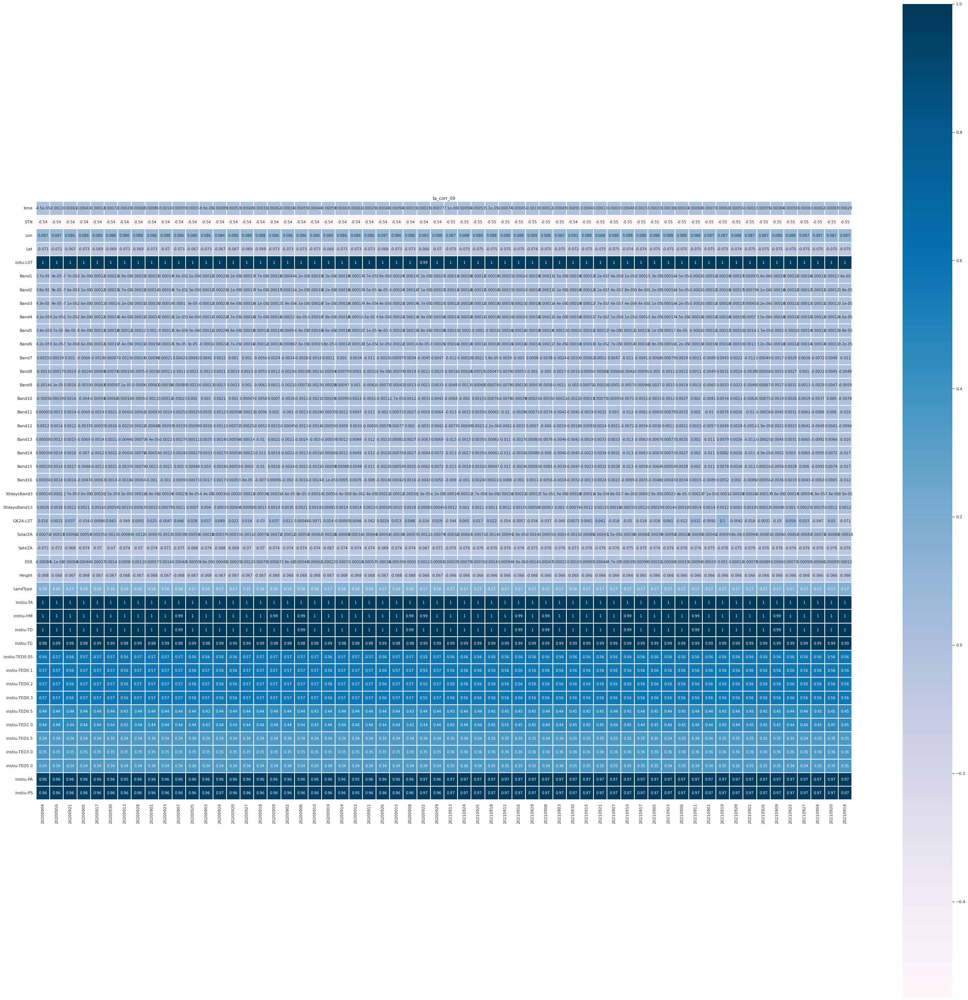

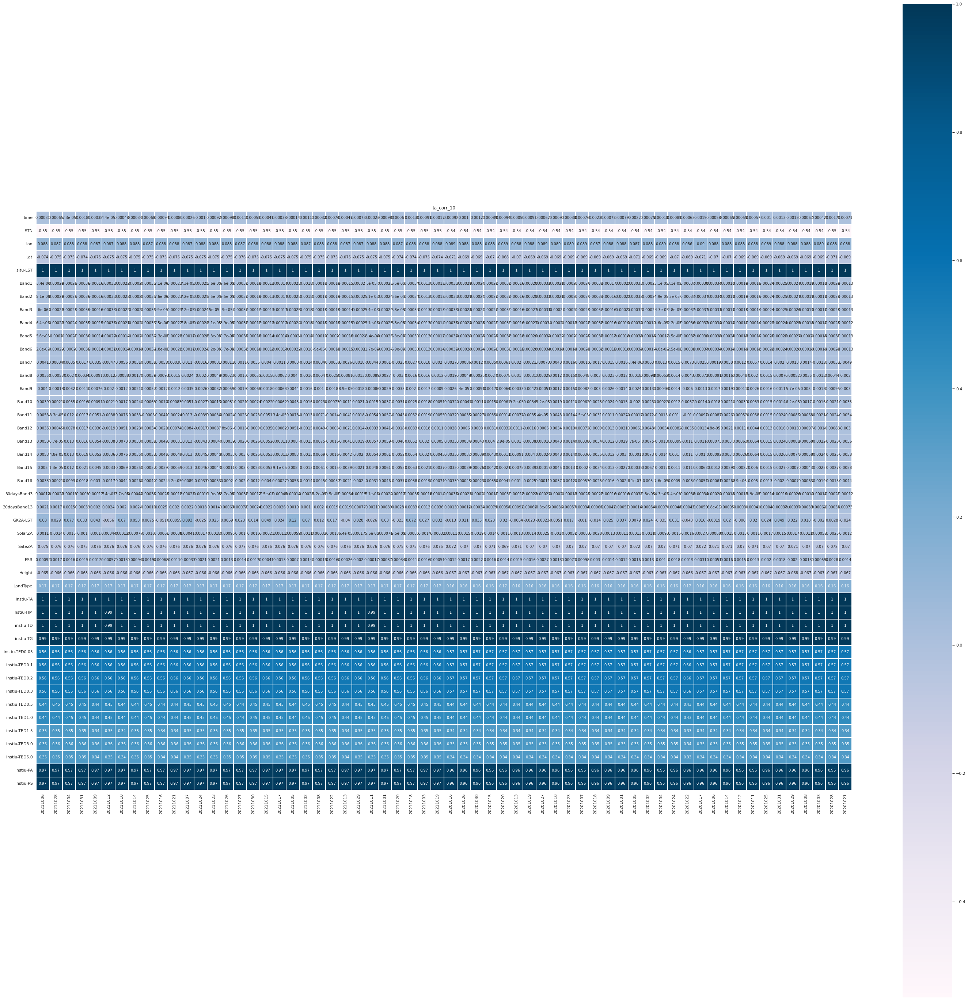

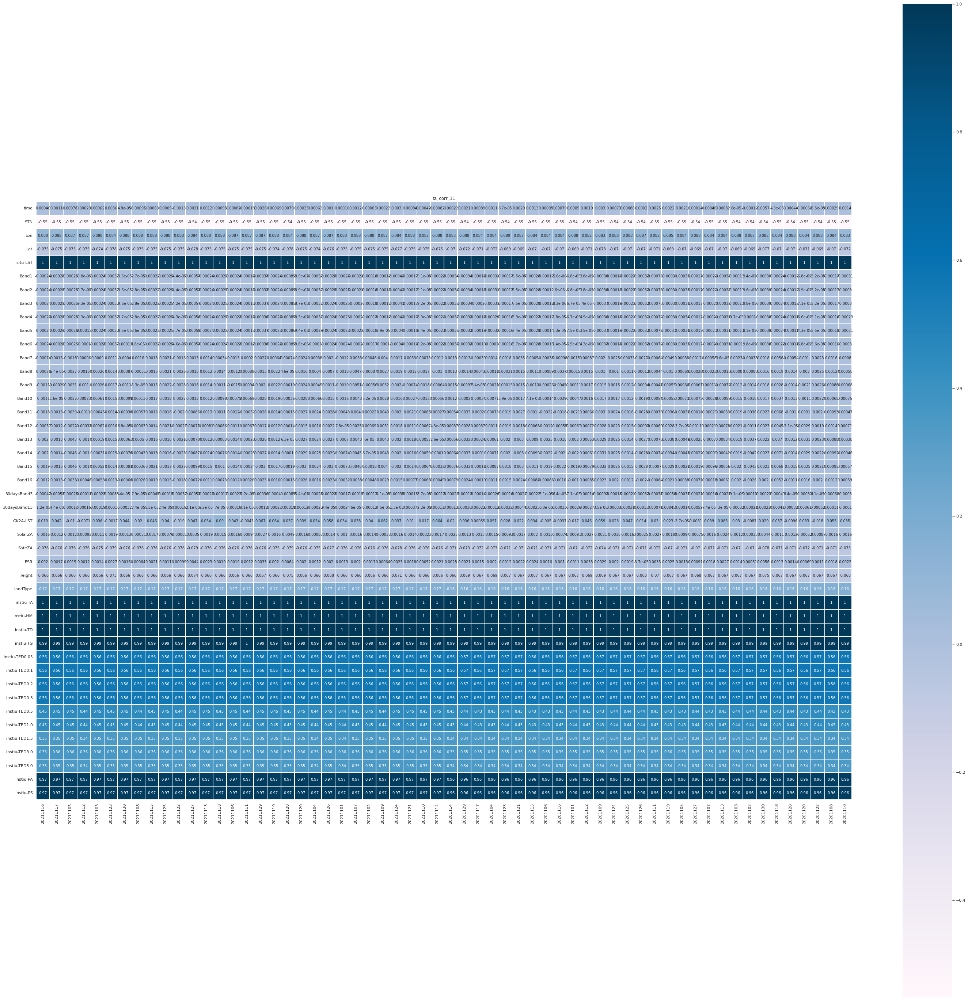

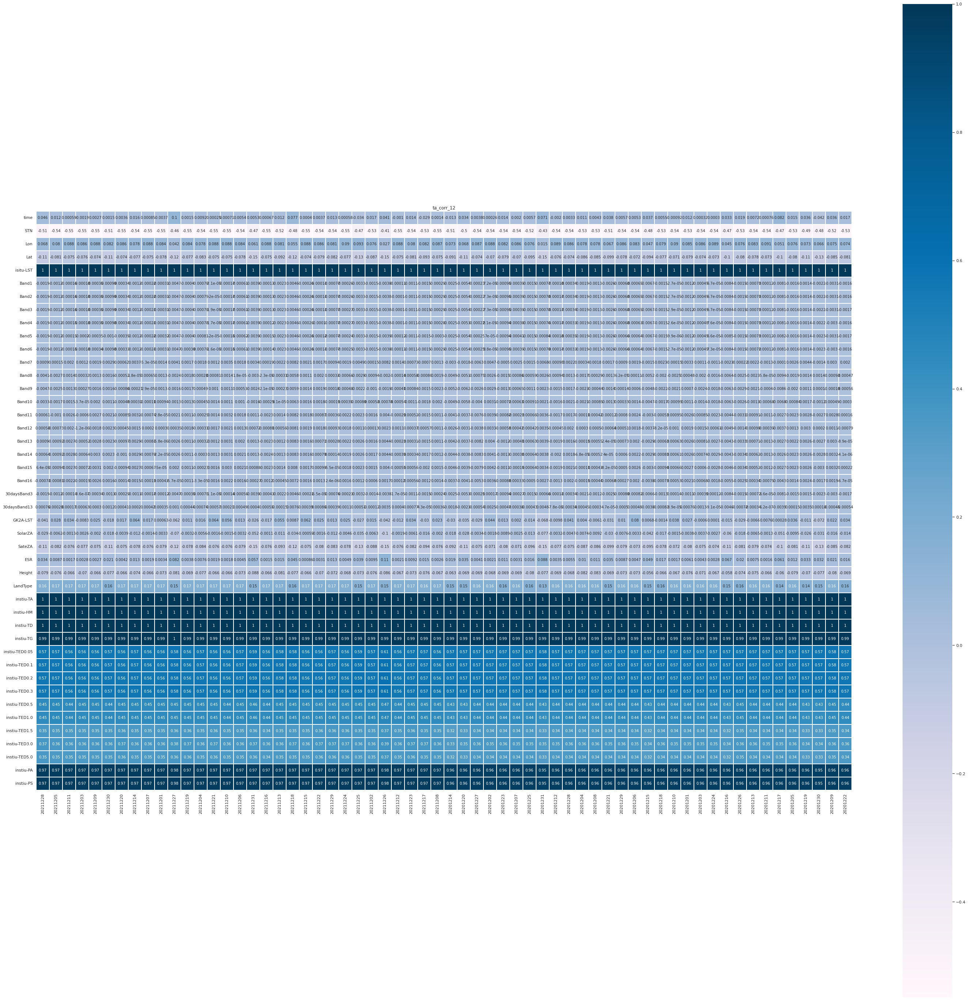

In [69]:

for month in MONTHS:
    plt.figure(figsize=(50, 50))
    plt.title(f'ta_corr_{month}')
    sns.set(font_scale=1)
    sns.heatmap(ta_corr[month], 
                linewidths = 0.1, 
                vmax = 1.0,
               square = True, 
                cmap = colormap, 
                linecolor = "white", 
                annot = True, 
                annot_kws = {"size" : 10}
               )


<AxesSubplot:>

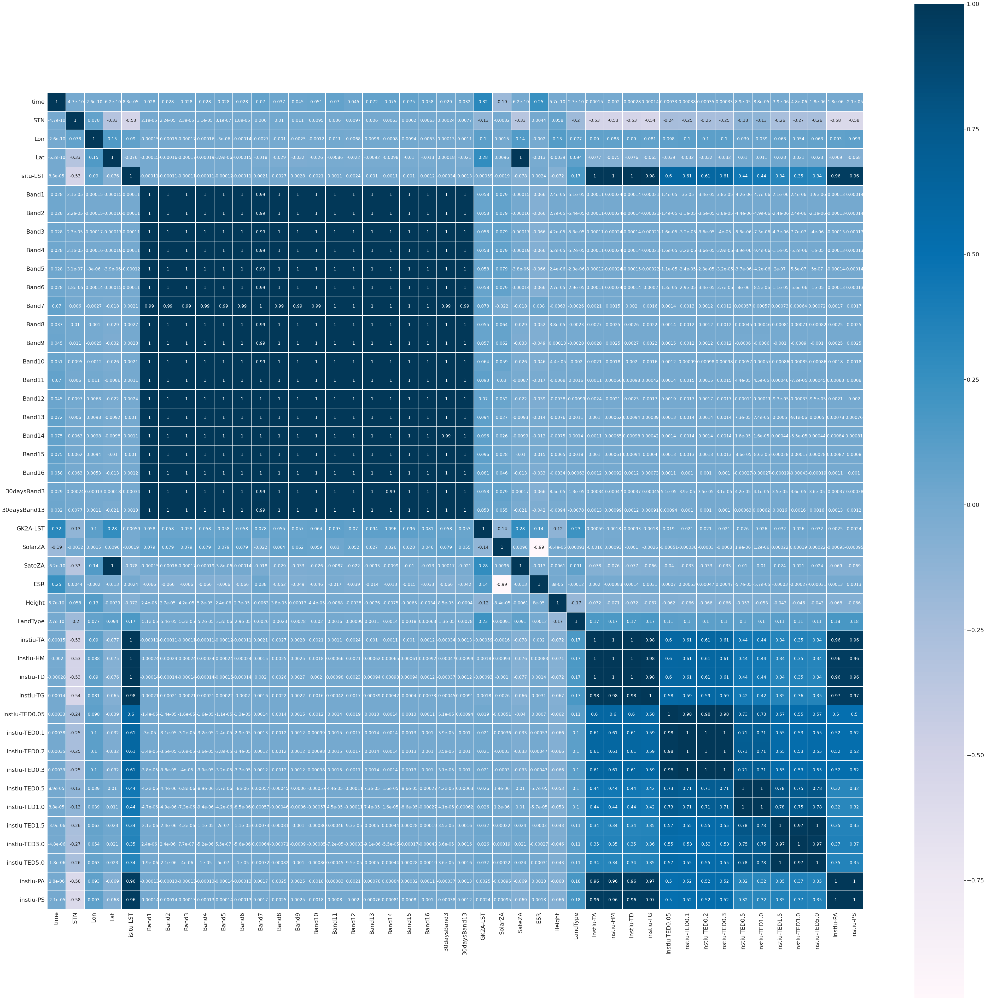

In [120]:

plt.figure(figsize=(70, 70))

sns.heatmap(corr, 
            linewidths = 0.1, 
            vmax = 1.0,
           square = True, 
            cmap = colormap, 
            linecolor = "white", 
            annot = True, 
            annot_kws = {"size" : 16}
           )

